In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.tree import plot_tree
from sklearn.pipeline import Pipeline
import pickle

In [2]:
df = pd.read_csv('cardio.csv',sep=';',index_col='id')

In [3]:
df.sample(5)

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
id,,,,,,,,,,,,
76933,18048,1,162,70.0,120,80,1,1,0,0,1,0
38687,18844,1,154,56.0,130,90,1,1,0,0,1,0
88147,19533,2,170,98.0,150,90,1,1,1,0,0,1
27611,21854,1,163,85.0,140,80,1,1,0,0,1,0
63714,20661,1,165,80.0,120,80,1,1,0,0,1,0


In [4]:
df.shape

(70000, 12)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 70000 entries, 0 to 99999
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          70000 non-null  int64  
 1   gender       70000 non-null  int64  
 2   height       70000 non-null  int64  
 3   weight       70000 non-null  float64
 4   ap_hi        70000 non-null  int64  
 5   ap_lo        70000 non-null  int64  
 6   cholesterol  70000 non-null  int64  
 7   gluc         70000 non-null  int64  
 8   smoke        70000 non-null  int64  
 9   alco         70000 non-null  int64  
 10  active       70000 non-null  int64  
 11  cardio       70000 non-null  int64  
dtypes: float64(1), int64(11)
memory usage: 6.9 MB


In [6]:
df.describe()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
count,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000
mean,19468.865814,1.349571,164.359229,74.205690,128.817286,96.630414,1.366871,1.226457,0.088129,0.053771,0.803729,0.499700
std,2467.251667,0.476838,8.210126,14.395757,154.011419,188.472530,0.680250,0.572270,0.283484,0.225568,0.397179,0.500003
min,10798.000000,1.000000,55.000000,10.000000,-150.000000,-70.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,17664.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,19703.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,21327.000000,2.000000,170.000000,82.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,23713.000000,2.000000,250.000000,200.000000,16020.000000,11000.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


Gender : 1 - women, 2 - men

Cholesterol 1: normal, 2: above normal, 3: well above normal

Gluc 1: normal, 2: above normal, 3: well above normal

active (Physical Activity) 0 : no, 1 : yes

ap_hi : <130 = normal(1) 130–139 = high-normal(2) 140+ = hypertension(3) 180+ = emergency(4)

ap_lo : <85 = normal(1) 85-89 = high-normal(2) 90-99 = hypertension(3) 99+ = emergency(4)

In [7]:
mask = df['ap_hi'] < df['ap_lo']
df.loc[mask, ['ap_hi', 'ap_lo']] = df.loc[mask, ['ap_lo', 'ap_hi']].values

In [8]:
# df['pulse_pressure'] = df['ap_hi'] - df['ap_lo']

In [9]:
df['age'] = df['age'] // 365

In [10]:
df.sample(5)

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
id,,,,,,,,,,,,
32302,50,1,169,92.0,150,90,3,3,0,0,1,1
24239,57,1,169,69.0,125,90,3,3,0,0,1,1
14030,57,1,146,78.0,160,100,1,1,0,0,1,1
72414,60,1,156,61.0,120,80,1,1,0,0,1,0
45434,54,2,175,70.0,120,60,1,1,0,0,1,0


In [11]:
df['bmi'] = (df['weight'] / (df['height'] * (0.01)) ** 2)

In [12]:
df['bmi'] = np.round(df['bmi'],2)

In [13]:
df.drop(columns=['height','weight'],inplace=True)

In [14]:
df.head()

,age,gender,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,bmi
id,,,,,,,,,,,
0,50,2,110,80,1,1,0,0,1,0,21.97
1,55,1,140,90,3,1,0,0,1,1,34.93
2,51,1,130,70,3,1,0,0,0,1,23.51
3,48,2,150,100,1,1,0,0,1,1,28.71
4,47,1,100,60,1,1,0,0,0,0,23.01


In [15]:
df.describe()

,age,gender,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,bmi
count,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000
mean,52.840671,1.349571,143.385229,82.062471,1.366871,1.226457,0.088129,0.053771,0.803729,0.499700,27.556545
std,6.766774,0.476838,240.193736,13.642535,0.680250,0.572270,0.283484,0.225568,0.397179,0.500003,6.091405
min,29.000000,1.000000,12.000000,-150.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,3.470000
25%,48.000000,1.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,23.880000
50%,53.000000,1.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,26.375000
75%,58.000000,2.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000,30.220000
max,64.000000,2.000000,16020.000000,220.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000,298.670000


Detecting and fixing outliers in age col

In [16]:
px.box(df['age'])

<Axes: xlabel='age', ylabel='Density'>

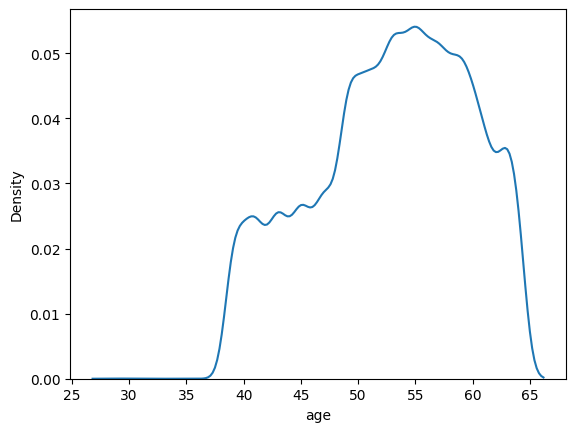

In [17]:
sns.kdeplot(df['age'])

In [18]:
df['age'] = np.where(df['age'] < 35, df['age'].mean(), df['age'])

In [19]:
px.box(df['age'])

<Axes: xlabel='age', ylabel='Density'>

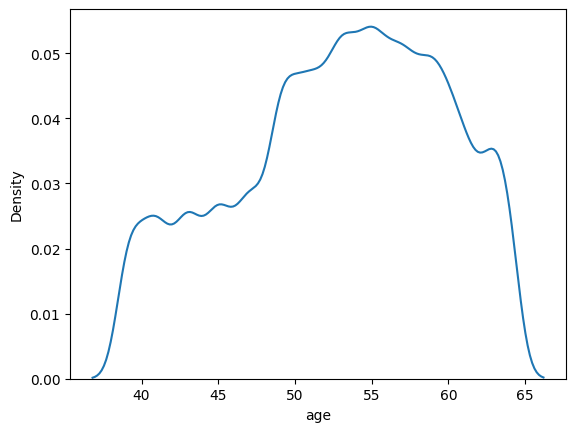

In [75]:
sns.kdeplot(df['age'])

Detecting and fixing outliers in bmi col

In [20]:
df['bmi'].describe([.01,.02,.1,.25,.50,.75,.9,.95,.995])

count    70000.000000
mean        27.556545
std          6.091405
min          3.470000
1%          18.610000
2%          19.530000
10%         22.070000
25%         23.880000
50%         26.375000
75%         30.220000
90%         34.530000
95%         37.390000
99.5%       47.870000
max        298.670000
Name: bmi, dtype: float64

In [21]:
px.box(df["bmi"])

In [22]:
df.shape

(70000, 11)

In [23]:
df = df[(df['bmi'] >= 10) & (df['bmi'] <= 50)]

In [24]:
df.shape

(69750, 11)

In [25]:
px.box(df["bmi"])

Detecting and fixing outliers in ap_hi col

In [26]:
px.box(df['ap_hi'])

<Axes: xlabel='ap_hi', ylabel='Density'>

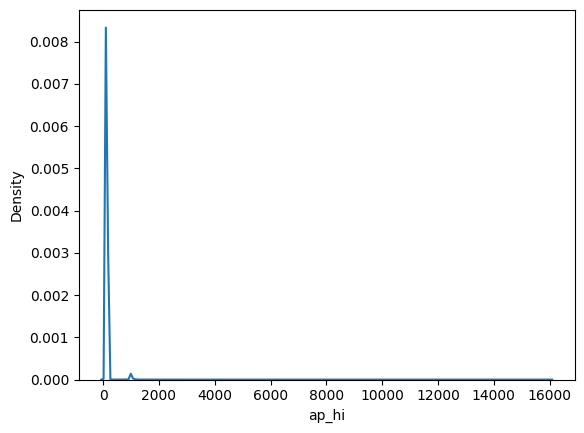

In [27]:
sns.kdeplot(df['ap_hi'])

In [28]:
df['ap_hi'].describe([0,.01,.10,.25,.50,.75,.80,.90,.95,.99])

count    69750.000000
mean       143.314065
std        240.434135
min         12.000000
0%          12.000000
1%          90.000000
10%        110.000000
25%        120.000000
50%        120.000000
75%        140.000000
80%        140.000000
90%        150.000000
95%        160.000000
99%       1000.000000
max      16020.000000
Name: ap_hi, dtype: float64

In [29]:
df[df['ap_hi'] > 180].shape

(1264, 11)

In [30]:
df = df[(df['ap_hi'] <= 220) & (df['ap_hi'] >= 50)]

In [31]:
df.shape

(68751, 11)

In [32]:
px.box(df['ap_hi'])

In [33]:
def convert_numerical_to_categorical_ap_hi(ap_hi):
    if ap_hi < 130:
        return 1 #Normal
    elif ap_hi >= 130 and ap_hi <= 139:
        return 2 #High-Normal
    elif ap_hi >= 140 and ap_hi < 180:
        return 3 #Hypertension
    elif ap_hi >= 180:
        return 4 #Emergency

In [34]:
df['ap_hi'] = df['ap_hi'].apply(convert_numerical_to_categorical_ap_hi)

In [35]:
df['ap_hi'].isnull().sum()

np.int64(0)

In [36]:
df['ap_hi'].value_counts()

ap_hi
1    41125
3    17543
2     9208
4      875
Name: count, dtype: int64

In [37]:
df.groupby(df['ap_hi'])['cardio'].mean()*100

ap_hi
1    31.754407
2    59.828410
3    83.571795
4    86.514286
Name: cardio, dtype: float64

Detecting and fixing outliers in ap_lo col

In [38]:
px.box(df['ap_lo'])

In [39]:
df = df[(df['ap_lo'] <= 130) & (df['ap_lo'] >= 40)]

In [40]:
df.shape

(68505, 11)

In [41]:
px.box(df['ap_lo'])

In [42]:
def convert_numerical_to_categorical_ap_lo(ap_lo):
    if ap_lo < 85:
        return 1 #Normal
    elif ap_lo >= 85 and ap_lo <= 89:
        return 2 #High-Normal
    elif ap_lo >= 90 and ap_lo <= 99:
        return 3 #Hypertension
    elif ap_lo >= 99:
        return 4 #Emergency

In [43]:
df['ap_lo'] = df['ap_lo'].apply(convert_numerical_to_categorical_ap_lo)

In [44]:
df['ap_lo'].value_counts()

ap_lo
1    48796
3    14530
4     4692
2      487
Name: count, dtype: int64

In [45]:
df['ap_lo'].isnull().sum()

np.int64(0)

In [46]:
df.groupby(df['ap_lo'])['cardio'].mean()*100

ap_lo
1    38.410935
2    58.110883
3    74.996559
4    83.844842
Name: cardio, dtype: float64

In [47]:
df.sample(5)

,age,gender,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,bmi
id,,,,,,,,,,,
96323,56.0,2,1,1,1,1,0,0,1,1,22.31
26608,64.0,1,2,3,1,1,0,0,1,1,26.26
77029,52.0,1,1,1,1,1,0,0,0,0,23.88
12532,50.0,1,1,1,1,1,0,0,1,0,29.41
60267,58.0,1,1,1,1,1,0,0,0,1,26.35


In [48]:
transform_cols = ['age','bmi']
transformer = ColumnTransformer(
    transformers=[
        ('trf_age',MinMaxScaler(),transform_cols)
    ],
    remainder='passthrough'
)

In [49]:
X = df.drop(columns=['cardio'])
y = df['cardio']

In [50]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=42)

In [51]:
X_train

,age,gender,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,bmi
id,,,,,,,,,,
36872,61.0,2,3,4,1,1,1,1,0,20.68
49246,55.0,1,2,1,1,1,0,0,1,29.24
57079,53.0,1,3,3,1,1,0,0,1,41.93
32440,61.0,2,1,3,1,1,0,0,1,31.21
3947,57.0,1,1,1,1,1,0,0,0,32.05
...,...,...,...,...,...,...,...,...,...,...
54258,43.0,1,1,1,1,1,0,0,1,24.54
9122,39.0,2,4,3,2,1,1,1,1,28.73
79991,58.0,1,1,1,2,1,0,0,1,29.33


In [52]:
X_train_trf = transformer.fit_transform(X_train)
X_test_trf = transformer.transform(X_test)

In [53]:
X_train_trf

array([[0.88      , 0.25337408, 2.        , ..., 1.        , 1.        ,
        0.        ],
       [0.64      , 0.47135218, 1.        , ..., 0.        , 0.        ,
        1.        ],
       [0.56      , 0.79449962, 1.        , ..., 0.        , 0.        ,
        1.        ],
       ...,
       [0.76      , 0.473644  , 1.        , ..., 0.        , 0.        ,
        1.        ],
       [0.96      , 0.44843392, 2.        , ..., 0.        , 0.        ,
        1.        ],
       [0.52      , 0.54061625, 2.        , ..., 0.        , 1.        ,
        1.        ]], shape=(47953, 10))

In [54]:
classifier = DecisionTreeClassifier()

In [55]:
classifier.fit(X_train_trf,y_train)

,"criterion criterion: {""gini"", ""entropy"", ""log_loss""}, default=""gini""The function to measure the quality of a split. Supported criteria are""gini"" for the Gini impurity and ""log_loss"" and ""entropy"" both for theShannon information gain, see :ref:`tree_mathematical_formulation`.",'gini'
,"splitter splitter: {""best"", ""random""}, default=""best""The strategy used to choose the split at each node. Supportedstrategies are ""best"" to choose the best split and ""random"" to choosethe best random split.",'best'
,"max_depth max_depth: int, default=NoneThe maximum depth of the tree. If None, then nodes are expanded untilall leaves are pure or until all leaves contain less thanmin_samples_split samples.",None
,"min_samples_split min_samples_split: int or float, default=2The minimum number of samples required to split an internal node:- If int, then consider `min_samples_split` as the minimum number.- If float, then `min_samples_split` is a fraction and `ceil(min_samples_split * n_samples)` are the minimum number of samples for each split... versionchanged:: 0.18 Added float values for fractions.",2
,"min_samples_leaf min_samples_leaf: int or float, default=1The minimum number of samples required to be at a leaf node.A split point at any depth will only be considered if it leaves atleast ``min_samples_leaf`` training samples in each of the left andright branches. This may have the effect of smoothing the model,especially in regression.- If int, then consider `min_samples_leaf` as the minimum number.- If float, then `min_samples_leaf` is a fraction and `ceil(min_samples_leaf * n_samples)` are the minimum number of samples for each node... versionchanged:: 0.18 Added float values for fractions.",1
,"min_weight_fraction_leaf min_weight_fraction_leaf: float, default=0.0The minimum weighted fraction of the sum total of weights (of allthe input samples) required to be at a leaf node. Samples haveequal weight when sample_weight is not provided.",0.0
,"max_features max_features: int, float or {""sqrt"", ""log2""}, default=NoneThe number of features to consider when looking for the best split:- If int, then consider `max_features` features at each split.- If float, then `max_features` is a fraction and `max(1, int(max_features * n_features_in_))` features are considered at each split.- If ""sqrt"", then `max_features=sqrt(n_features)`.- If ""log2"", then `max_features=log2(n_features)`.- If None, then `max_features=n_features`... note:: The search for a split does not stop until at least one valid partition of the node samples is found, even if it requires to effectively inspect more than ``max_features`` features.",None
,"random_state random_state: int, RandomState instance or None, default=NoneControls the randomness of the estimator. The features are alwaysrandomly permuted at each split, even if ``splitter`` is set to``""best""``. When ``max_features < n_features``, the algorithm willselect ``max_features`` at random at each split before finding the bestsplit among them. But the best found split may vary across differentruns, even if ``max_features=n_features``. That is the case, if theimprovement of the criterion is identical for several splits and onesplit has to be selected at random. To obtain a deterministic behaviourduring fitting, ``random_state`` has to be fixed to an integer.See :term:`Glossary ` for details.",None
,"max_leaf_nodes max_leaf_nodes: int, default=NoneGrow a tree with ``max_leaf_nodes`` in best-first fashion.Best nodes are defined as relative reduction in impurity.If None then unlimited number of leaf nodes.",None
,"min_impurity_decrease min_impurity_decrease: float, default=0.0A node will be split if this split induces a decrease of the impuritygreater than or equal to this value.The weighted impurity decrease equation is the following:: N_t / N * (impurity - N_t_R / N_t * right_impurity - N_t_L / N_t * left_impurity)where ``N`` is the total number of samples, ``N_t`` is the number ofsamples at the curre

In [56]:
y_pred = classifier.predict(X_test_trf)

In [57]:
accuracy_score(y_test,y_pred)

0.6365317244063838

In [58]:
from sklearn.metrics import recall_score

In [59]:
recall_score(y_test, y_pred)

0.6067471309853582

In [60]:
param_grid = {
    'criterion':['gini','entropy'],
    'max_depth':[4,5,6,7,8,9,10,11,12,15,20,30,40,50,70,90,120,150]
}   

In [61]:
cv = GridSearchCV(DecisionTreeClassifier(),param_grid=param_grid,cv=10,scoring='accuracy')

In [62]:
cv.fit(X_train_trf,y_train)

,"estimator estimator: estimator objectThis is assumed to implement the scikit-learn estimator interface.Either estimator needs to provide a ``score`` function,or ``scoring`` must be passed.",DecisionTreeClassifier()
,"param_grid param_grid: dict or list of dictionariesDictionary with parameters names (`str`) as keys and lists ofparameter settings to try as values, or a list of suchdictionaries, in which case the grids spanned by each dictionaryin the list are explored. This enables searching over any sequenceof parameter settings.","{'criterion': ['gini', 'entropy'], 'max_depth': [4, 5, ...]}"
,"scoring scoring: str, callable, list, tuple or dict, default=NoneStrategy to evaluate the performance of the cross-validated model onthe test set.If `scoring` represents a single score, one can use:- a single string (see :ref:`scoring_string_names`);- a callable (see :ref:`scoring_callable`) that returns a single value;- `None`, the `estimator`'s :ref:`default evaluation criterion ` is used.If `scoring` represents multiple scores, one can use:- a list or tuple of unique strings;- a callable returning a dictionary where the keys are the metric names and the values are the metric scores;- a dictionary with metric names as keys and callables as values.See :ref:`multimetric_grid_search` for an example.",'accuracy'
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details... versionchanged:: v0.20 `n_jobs` default changed from 1 to None",None
,"refit refit: bool, str, or callable, default=TrueRefit an estimator using the best found parameters on the wholedataset.For multiple metric evaluation, this needs to be a `str` denoting thescorer that would be used to find the best parameters for refittingthe estimator at the end.Where there are considerations other than maximum score inchoosing a best estimator, ``refit`` can be set to a function whichreturns the selected ``best_index_`` given ``cv_results_``. In thatcase, the ``best_estimator_`` and ``best_params_`` will be setaccording to the returned ``best_index_`` while the ``best_score_``attribute will not be available.The refitted estimator is made available at the ``best_estimator_``attribute and permits using ``predict`` directly on this``GridSearchCV`` instance.Also for multiple metric evaluation, the attributes ``best_index_``,``best_score_`` and ``best_params_`` will only be available if``refit`` is set and all of them will be determined w.r.t this specificscorer.See ``scoring`` parameter to know more about multiple metricevaluation.See :ref:`sphx_glr_auto_examples_model_selection_plot_grid_search_digits.py`to see how to design a custom selection strategy using a callablevia `refit`.See :ref:`this example`for an example of how to use ``refit=callable`` to balance modelcomplexity and cross-validated score... versionchanged:: 0.20 Support for callable added.",True
,"cv cv: int, cross-validation generator or an iterable, default=NoneDetermines the cross-validation splitting strategy.Possible inputs for cv are:- None, to use the default 5-fold cross validation,- integer, to specify the number of folds in a `(Stratified)KFold`,- :term:`CV splitter`,- An iterable yielding (train, test) splits as arrays of indices.For integer/None inputs, if the estimator is a classifier and ``y`` iseither binary or multiclass, :class:`StratifiedKFold` is used. In allother cases, :class:`KFold` is used. These splitters are instantiatedwith `shuffle=False` so the splits will be the same across calls.Refer :ref:`User Guide ` for the variouscross-validation strategies that can be used here... versionchanged:: 0.22 ``cv`` default value if None changed from 3-fold to 5-fold.",10
,"verbose verbose: intControls the verbosity: the higher, the more messages.- >1 : the computation time for each fold and parameter candidate is displayed;- >2 : the score is also displayed;-

In [63]:
y_pred = cv.predict(X_test_trf)

In [64]:
accuracy_score(y_test,y_pred)

0.7279096924873492

In [65]:
recall_score(y_test, y_pred)

0.6797586070439257

In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV

xgb = XGBClassifier(
    objective='binary:logistic',
    eval_metric='logloss',
    random_state=42,
    n_jobs=-1
)

param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 5, 10,12, 18, 20, 25, 30, 35],
    'learning_rate': [0.01, 0.05, 0.1],
    'subsample': [0.7, 1.0],
    'colsample_bytree': [0.7, 1.0]
}

grid = GridSearchCV(
    estimator=xgb,
    param_grid=param_grid,
    cv=3,          
    n_jobs=-1,
    verbose=1
)

grid.fit(X_train_trf, y_train)
y_pred = grid.predict(X_test_trf)

# accuracy_score(y_pred,y_test)
recall_score(y_test, y_pred)

Fitting 3 folds for each of 216 candidates, totalling 648 fits


0.6741195092995647

In [67]:
grid.best_params_

{'colsample_bytree': 0.7,
 'learning_rate': 0.01,
 'max_depth': None,
 'n_estimators': 200,
 'subsample': 0.7}

In [68]:
cols_to_scale = ['age','bmi','ap_hi','ap_lo']

transformer = ColumnTransformer(
    transformers=[
        ('num_scaler', MinMaxScaler(), cols_to_scale)
    ],
    remainder='passthrough'
)

xgb = XGBClassifier(
    colsample_bytree = 1.0,
    learning_rate = 0.05,
    max_depth = 5,
    n_estimators = 100,
    subsample = 0.7
)

pipeline = Pipeline(steps=[
    ('transformer', transformer),
    ('model', xgb)
])

param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [5, 10, 12, 18, 20, 25, 30, 35],
    'learning_rate': [0.01, 0.05, 0.1],
    'subsample': [0.7, 1.0],
    'colsample_bytree': [0.7, 1.0]
}


In [69]:
grid.best_params_

{'colsample_bytree': 0.7,
 'learning_rate': 0.01,
 'max_depth': None,
 'n_estimators': 200,
 'subsample': 0.7}

In [70]:
pipeline.fit(X_train,y_train)

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators ` for more details.","[('transformer', ...), ('model', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing `.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('num_scaler', ...)]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'passthrough'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the different transformers con

In [71]:
y_pred = pipeline.predict(X_test)

In [72]:
accuracy_score(y_test,y_pred)

0.7348676527831841

In [73]:
recall_score(y_test, y_pred)

0.6810447170557974

In [74]:
with open('model.pickle', 'wb') as file:
    pickle.dump(pipeline, file)